In [1]:
import h5py

In [2]:
!ls /fast_scratch/QVAE/data/calo

eplus.hdf5  gamma.hdf5	piplus.hdf5


In [3]:
ef = h5py.File('/fast_scratch/QVAE/data/calo/eplus.hdf5','r')
gf = h5py.File('/fast_scratch/QVAE/data/calo/gamma.hdf5','r')
pf = h5py.File('/fast_scratch/QVAE/data/calo/piplus.hdf5','r')

In [4]:
list(ef.keys())

['energy', 'layer_0', 'layer_1', 'layer_2', 'overflow']

In [5]:
for key in ef.keys():
    print(key, ef[key].shape, ef[key].dtype)

energy (100000, 1) float64
layer_0 (100000, 3, 96) float64
layer_1 (100000, 12, 12) float64
layer_2 (100000, 12, 6) float64
overflow (100000, 3) float64


In [6]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import random
import numpy as np
import re

In [29]:
import matplotlib.ticker as tkr 

hdfs = [ef, gf, pf]
ptypes = ['eplus', 'gamma', 'piplus']
colors = ['red', 'blue', 'black']

def numfmt(x, pos): # your custom formatter function: divide by 100.0
    s = '{}'.format(int(x / 1000))
    return s

Text(0.5, 0.98, 'Calorimeter block energy spectrum per particle type (Observed)')

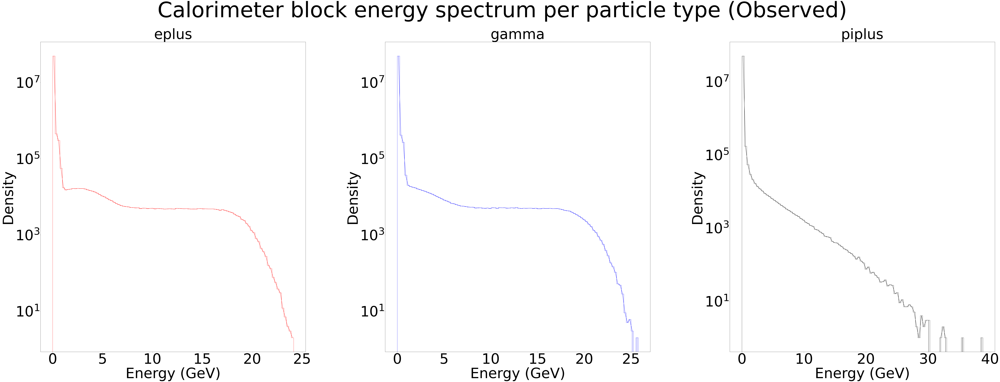

In [87]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(120, 40))
# Default - plt.subplots_adjust(left=0.125, bottom=0.9, right=0.1, top=0.9, wspace=0.2, hspace=0.2)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.3, hspace=None)
xfmt = tkr.FuncFormatter(numfmt)
    
for i, hdf in enumerate(hdfs):
    npl0 = np.array(hdf['layer_0'])
    npl1 = np.array(hdf['layer_1'])
    npl2 = np.array(hdf['layer_2'])
    
    npl0 = npl0.reshape(npl0.shape[0], -1)
    npl1 = npl1.reshape(npl1.shape[0], -1)
    npl2 = npl2.reshape(npl2.shape[0], -1)
    
    nplcat = np.concatenate([npl0, npl1, npl2], axis=1).reshape(-1)
    
    vals, bins,_ = ax[i].hist(nplcat, bins=100, histtype='step', density=False, color=colors[i])
    binc = 0.5*(bins[1:]+bins[:-1])
    ax[i].plot(binc, vals, color=colors[i])
    
    ax[i].tick_params(labelsize=100)
    ax[i].set_xlabel('Energy (GeV)', fontsize=100)
    ax[i].set_ylabel('Density', fontsize=100)
    ax[i].set_title(ptypes[i], fontsize=100)
    ax[i].xaxis.set_major_formatter(xfmt)
    ax[i].set_yscale("log")
    
fig.suptitle('Calorimeter block energy spectrum per particle type (Observed)', fontsize=150)

In [88]:
nrows = 9
blocks = [10, 144, 280, 298, 360, 420, 442, 468, 498]
fig, ax = plt.subplots(nrows=nrows, ncols=3, figsize=(120, 400))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.3, hspace=None)
xfmt = tkr.FuncFormatter(numfmt)
    
for i, hdf in enumerate(hdfs):
    npl0 = np.array(hdf['layer_0'])
    npl1 = np.array(hdf['layer_1'])
    npl2 = np.array(hdf['layer_2'])
    
    npl0 = npl0.reshape(npl0.shape[0], -1)
    npl1 = npl1.reshape(npl1.shape[0], -1)
    npl2 = npl2.reshape(npl2.shape[0], -1)
    
    nplcat = np.concatenate([npl0, npl1, npl2], axis=1)
    
    for j in range(nrows):
        vals, bins,_ = ax[j, i].hist(nplcat[:, blocks[j]], bins=100, histtype='step', density=False, color=colors[i])
        binc = 0.5*(bins[1:]+bins[:-1])
        ax[j, i].plot(binc, vals, color=colors[i])

        ax[j, i].tick_params(labelsize=100)
        ax[j, i].set_xlabel('Energy (MeV)', fontsize=100)
        ax[j, i].set_ylabel('Density', fontsize=100)
        ax[j, i].set_title(str(ptypes[i]) + ' , Block = ' + str(blocks[j]), fontsize=100)
        ax[j, i].set_yscale("log")
    
fig.suptitle('Calorimeter block energy spectrum per particle type (Observed)', fontsize=150)
plt.savefig("raw_values.png", dpi=10)

In [49]:
nplcats = []
for i, hdf in enumerate(hdfs):
    npl0 = np.array(hdf['layer_0'])
    npl1 = np.array(hdf['layer_1'])
    npl2 = np.array(hdf['layer_2'])
    
    npl0 = npl0.reshape(npl0.shape[0], -1)
    npl1 = npl1.reshape(npl1.shape[0], -1)
    npl2 = npl2.reshape(npl2.shape[0], -1)
    
    nplcats.append(np.concatenate([npl0, npl1, npl2], axis=1))

In [50]:
for i in range(len(nplcats)):
    print(nplcats[i].shape)

(100000, 504)
(100000, 504)
(100000, 504)


In [51]:
from sklearn.preprocessing import RobustScaler

In [52]:
nplcatscaled = []
for i in range(len(nplcats)):
    transformer = RobustScaler().fit(nplcats[i])
    nplcatscaled.append(transformer.transform(nplcats[i]))

In [53]:
for i in range(len(nplcats)):
    print(nplcatscaled[i].shape)

(100000, 504)
(100000, 504)
(100000, 504)


In [55]:
nrows = 9
blocks = [10, 144, 280, 298, 360, 420, 442, 468, 498]
fig, ax = plt.subplots(nrows=nrows, ncols=3, figsize=(120, 400))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.3, hspace=None)
xfmt = tkr.FuncFormatter(numfmt)
    
for i, hdf in enumerate(hdfs):    
    for j in range(nrows):
        vals, bins, _ = ax[j, i].hist(nplcatscaled[i][:, blocks[j]], bins=100, histtype='step', density=True, color=colors[i])
        binc = 0.5*(bins[1:]+bins[:-1])
        ax[j, i].plot(binc, vals, color=colors[i])

        ax[j, i].tick_params(labelsize=100)
        ax[j, i].set_xlabel('Energy (Scaled)', fontsize=100)
        ax[j, i].set_ylabel('Density', fontsize=100)
        ax[j, i].set_title(str(ptypes[i]) + ' , Block = ' + str(blocks[j]), fontsize=100)
        ax[j, i].set_yscale("log")
    
fig.suptitle('Calorimeter block energy spectrum per particle type (Observed)', fontsize=150)

Text(0.5, 0.98, 'Calorimeter block energy spectrum per particle type (Observed)')

In [63]:
from sklearn.preprocessing import StandardScaler

In [81]:
nplcatscaled = []
for i in range(len(nplcats)):
    nparr = nplcats[i]
    nparr = np.where(nparr > 0., nparr, None)
    transformer = RobustScaler().fit(nparr)
    nparr = transformer.transform(nparr)
    nparr = np.where(nparr == None, 0., nparr)
    nplcatscaled.append(nparr)

In [82]:
nrows = 9
blocks = [10, 144, 280, 298, 360, 420, 442, 468, 498]
fig, ax = plt.subplots(nrows=nrows, ncols=3, figsize=(120, 400))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.3, hspace=None)
xfmt = tkr.FuncFormatter(numfmt)
    
for i, hdf in enumerate(hdfs):    
    for j in range(nrows):
        vals, bins, _ = ax[j, i].hist(nplcatscaled[i][:, blocks[j]], bins=100, histtype='step', density=True, color=colors[i])
        binc = 0.5*(bins[1:]+bins[:-1])
        ax[j, i].plot(binc, vals, color=colors[i])

        ax[j, i].tick_params(labelsize=100)
        ax[j, i].set_xlabel('Energy (Scaled)', fontsize=100)
        ax[j, i].set_ylabel('Density', fontsize=100)
        ax[j, i].set_title(str(ptypes[i]) + ' , Block = ' + str(blocks[j]), fontsize=100)
        ax[j, i].set_yscale("log")
    
fig.suptitle('Calorimeter block energy spectrum per particle type (Observed)', fontsize=150)
plt.savefig("robust_scaler_default.png", dpi=10)

In [117]:
nplcatscaled = []
epsilon = 1e-2

for i in range(len(nplcats)):
    nparr = nplcats[i]
    nparr = np.where(nparr > 0., nparr, np.nan)
    transformer = StandardScaler().fit(nparr)
    nparr = transformer.transform(nparr)
    
    nparr = np.where(np.isnan(nparr), np.inf, nparr)
    
    for j in range(nparr.shape[1]):
        arrmin = np.amin(nparr[:, j])
        if arrmin < 0 and not np.isnan(arrmin):
            print(j, arrmin)
            nparr[:, j] -= arrmin
            nparr[:, j] += epsilon
            
    nparr = np.where(np.isinf(nparr), 0, nparr)
    
    for j in range(nparr.shape[1]):
        arrmin = np.amin(nparr[:, j])
        if arrmin < 0:
            print(j, arrmin)
            
    nplcatscaled.append(nparr)

0 -0.5959064373416986
1 -0.5622603200408175
2 -0.37513110935013355
3 -0.6737464227445097
4 -0.629446319873555
5 -0.6720499945434836
6 -0.7302354625912914
7 -0.7172861209373235
8 -0.7028860397764091
9 -0.7345743016415225
10 -0.6836477418781669
11 -0.6973972609377652
12 -0.7288815012062925
13 -0.7322435141756855
14 -0.7567346767560692
15 -0.7187761469688931
16 -0.7493992596107317
17 -0.6886990813275131
18 -0.5955661933364701
19 -0.758772870266937
20 -0.7486757372817129
21 -0.6744731828368059
22 -0.7979090057187314
23 -0.7702256173688452
24 -0.8121844160731246
25 -0.7760967778174547
26 -0.7753829365363561
27 -0.7408317852620152
28 -0.7798878372220637
29 -0.7350784816719097
30 -0.8244806915064258
31 -0.837450391153935
32 -0.8265436305293953
33 -0.8012540710792301
34 -0.8441669480976528
35 -0.8272459138771697
36 -0.8425398132824912
37 -0.8498636207731
38 -0.850767351049863
39 -0.856530789339261
40 -0.8758901766232691
41 -0.8556008494014192
42 -0.847688302994781
43 -0.8769419360557953
44 -0.

In [116]:
a = np.nan
a < 0

False

In [98]:
a = np.random.randn(4, 3)
print(a)
print(np.amin(a[:, 1]))

[[-0.19684073 -0.7651796   0.96389242]
 [ 0.65656497 -0.59513732  1.82310463]
 [-0.3369558   2.3323588   0.45160986]
 [-0.73248907  0.5008746  -1.21206402]]
-0.7651796020439856


In [118]:
nrows = 9
blocks = [10, 144, 280, 298, 360, 420, 442, 468, 498]
fig, ax = plt.subplots(nrows=nrows, ncols=3, figsize=(120, 400))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.3, hspace=None)
xfmt = tkr.FuncFormatter(numfmt)
    
for i, hdf in enumerate(hdfs):    
    for j in range(nrows):
        vals, bins, _ = ax[j, i].hist(nplcatscaled[i][:, blocks[j]], bins=100, histtype='step', density=False, color=colors[i])
        binc = 0.5*(bins[1:]+bins[:-1])
        ax[j, i].plot(binc, vals, color=colors[i])

        ax[j, i].tick_params(labelsize=100)
        ax[j, i].set_xlabel('Energy (Scaled)', fontsize=100)
        ax[j, i].set_ylabel('Events', fontsize=100)
        ax[j, i].set_title(str(ptypes[i]) + ' , Block = ' + str(blocks[j]), fontsize=100)
        ax[j, i].set_yscale("log")
    
fig.suptitle('Calorimeter block energy spectrum per particle type (Observed)', fontsize=150)
plt.savefig("standard_scaler_default_pos.png", dpi=10)

In [121]:
nplcatscaled[0].shape

(100000, 504)

In [122]:
for i in range(len(nplcats)):
    nparr = nplcats[i]
    transformer = RobustScaler().fit(nparr)
    print("center_", transformer.center_[:100])
    print("scale_", transformer.scale_[:100])

center_ [0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.00787226 0.088005   0.11877162 0.19338166
 0.25301459 0.30576407 0.35821376 0.40203355 0.44445746 0.47771426
 0.51099891 0.51099891 0.54520888 0.56032478 0.58089316 0.58636232
 0.59448641 0.5906581  0.56947388 0.53983227 0.51549903 0.51099891
 0.47751358 0.43770034 0.39846459 0.3524042  0.30759932 0.25018972
 0.19272689 0.11101194 0.088005   0.00889892 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.     

In [ ]:
for i in range(len(nplcats)):
    nparr = nplcats[i]
    nparr = np.where(nparr > 0., nparr, None)
    transformer = RobustScaler().fit(nparr)
    print("center_", transformer.center_[:10])
    print("scale_", transformer.scale_[:10])